# 3. 港湾におけるターミナル運用の変化を検出できるようにする

このセクションは、ALOS-2による港湾のターミナル運用の変化を検出することに興味のある学習者のために設計されています。

## 主な学習目標は以下の通り：
- スペックルノイズを低減する前処理
- ALOS-2衛星画像によるトヨタ自動車名古屋港施設の可視化
- COVID-19危機における港湾作業の変化検出

## 3.1 スペックルノイズ低減のための前処理

本節では、ALOS-2 合成開口レーダ(SAR)画像を解析するための前処理について述べる。
- ALOS-2 画像のダウンロード
- センサ関連のバイアスを調整するためのキャリブレーション
- スペックルノイズを低減するための Lee フィルタの適用

**ALOS-2の画像をOwncloudからダウンロードし、次のステップであるデータ処理のために解凍する**。

In [1]:
%cd /home/jovyan/shared/Sirinya/alos/ALOS2.1
!wget --content-disposition "https://owncloud.glodal-inc.net/owncloud/index.php/s/7LpA8rRJjIUFabL/download"

/home/jovyan/shared/Sirinya/alos/ALOS2.1
--2024-11-14 10:28:08--  https://owncloud.glodal-inc.net/owncloud/index.php/s/7LpA8rRJjIUFabL/download
Resolving owncloud.glodal-inc.net (owncloud.glodal-inc.net)... 104.21.78.155, 172.67.223.87, 2606:4700:3033::6815:4e9b, ...
Connecting to owncloud.glodal-inc.net (owncloud.glodal-inc.net)|104.21.78.155|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 32213209 (31M) [application/zip]
Saving to: ‘Shimpomachi_ngo.zip.1’

Shimpomachi_ngo.zip 100%[===================>]  30.72M  15.0MB/s    in 2.0s    

2024-11-14 10:28:11 (15.0 MB/s) - ‘Shimpomachi_ngo.zip.1’ saved [32213209/32213209]



In [2]:
!unzip "Shimpomachi_ngo.zip"

Archive:  Shimpomachi_ngo.zip
replace Shimpomachi_ngo/HH-191127.tif? [y]es, [n]o, [A]ll, [N]one, [r]ename: ^C


**ALOS-2 画像の読み込み**

このPythonコードは、ALOS-2のSAR画像を読み込むためのもので、指定したフォルダにある全ての.tifファイルのパスを読み込みます。

In [4]:
pip install rasterio

Note: you may need to restart the kernel to use updated packages.


In [5]:
import os

# ALOS-2 データフォルダへのパスを定義する。
data_folder = '/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/data'

# フォルダ内のすべてのGeoTIFFファイルを検索する
alos_files = [os.path.join(data_folder, f) for f in os.listdir(data_folder) if f.endswith('.tif')]
if not alos_files:
    raise FileNotFoundError("No GeoTIFF files found in the specified directory.")
    
# 見つかったファイルのリストを表示する
print("ALOS-2 files to visualize:")
for file in alos_files:
    print(file)


ALOS-2 files to visualize:
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/data/HH-220302.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/data/HH-210303.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/data/HH-200610.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/data/HH-210609.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/data/HH-211124.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/data/HH-191127.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/data/HH-200304.tif


**画像の可視化**

このセルは、メタデータを表示せずに、フォルダ内で見つかった各画像を視覚化します。

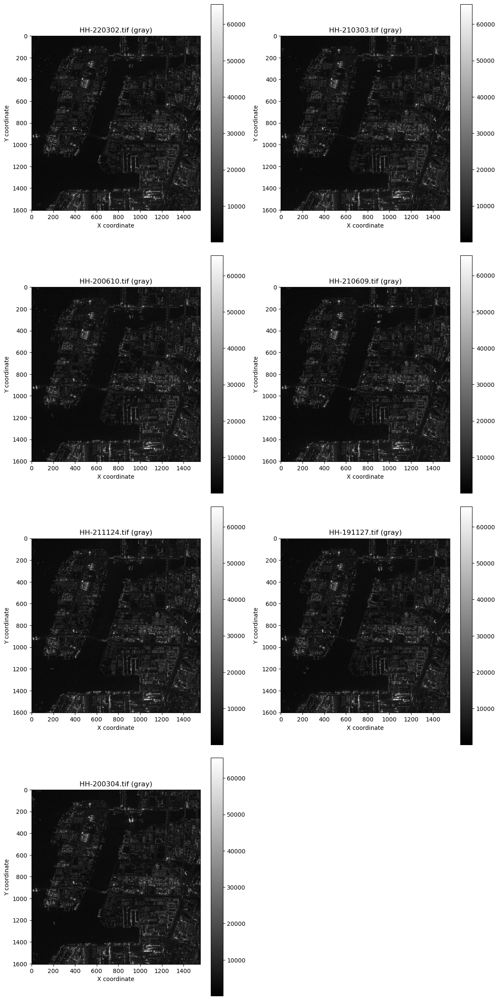

In [6]:
import rasterio
import matplotlib.pyplot as plt
import os

# カラーマップを選ぶ
color_map = 'gray'  # Options: 'gray', 'viridis', 'plasma', 'inferno', 'jet', 'cividis', etc.

# グリッドの列数を定義する
n_cols = 2
n_rows = (len(alos_files) + n_cols - 1) // n_cols  # Calculate required rows based on the number of files

# サブプロットでフィギュアを作る
fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, n_rows * 6))
axes = axes.flatten()  # Flatten to make it easy to iterate over

# 各ファイルをループし、選択したカラーマップで画像を可視化する。
for idx, alos_path in enumerate(alos_files):
    with rasterio.open(alos_path) as src:
        alos_image = src.read(1)  # 最初のバンドを読む（シングルバンドのデータを想定）

    # それぞれのサブプロットに画像をプロットする
    ax = axes[idx]
    img = ax.imshow(alos_image, cmap=color_map)
    ax.set_title(f"{os.path.basename(alos_path)} ({color_map})")
    ax.set_xlabel("X coordinate")
    ax.set_ylabel("Y coordinate")
    fig.colorbar(img, ax=ax)

# 使われていないサブプロットを隠す
for j in range(idx + 1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()


**画像の校正**

データ取得後、ラジオメトリック較正係数を適用し、デジタル数値(DN)を後方散乱値(dB)に変換します：

- σ0 = 10*log10(DN2) - 83.0 dBALOS-2校正結果-2](https://www.eorc.jaxa.jp/ALOS/en/alos-2/a2_calval_e.htm)注：ラジオメトリック校正は、ALOS-2 SARデータを地表面を正確に反映した意味のある後方散乱値に変換するために不可欠です。このプロセスはセンサーの偏りを補正し、異なるセンサーや取得時間間でデータを比較できるようにします。適切な校正は、一貫性のある物理的に正確な測定を保証することにより、環境モニタリング、土地利用分類、災害管理などの詳細な分析を可能にします。

注：上記の式は式と同じです： 20 * np.log10(ALOS-2データ) - 83.0)0)

In [7]:
import numpy as np
import rasterio

# 画像をキャリブレーションする関数を定義する
def calibrate_image(image):
    # 負の値をクリップして、正でない値の対数を取らないようにする。
    clipped_image = np.clip(image, a_min=1e-10, a_max=None)  # Prevent log(0)
    # 校正式を適用する
    calibrated_image = (20 * np.log10(clipped_image)) - 83
    return calibrated_image

# オリジナル画像にキャリブレーションを適用し、辞書に保存する。
calibrated_images = {}
for alos_path in alos_files:
    with rasterio.open(alos_path) as src:
        alos_image = src.read(1)  # Read the first band (Assuming single-band data)

    # オリジナル画像のキャリブレーション
    calibrated_images[alos_path] = calibrate_image(alos_image)


**キャリブレーションされた画像にLeeフィルターを適用する**。

Leeフィルタは、移動窓の局所統計量(平均と分散)を計算し、エッジを保存しながらスペックルノイズを低減するために使用します。このセルはlee_filter関数を定義し、ディレクトリ内の各ALOS-2画像に適用します。フィルタリングされた画像は辞書 filtered_images に格納される。

注意: lee_filter() 関数の size=3 パラメータは、各ピクセルの局所統計量(平均、分散)を計算するために使用される正方形の窓またはカーネルのサイズを意味する。この場合，3x3の窓が各ピクセルの周りに適用されます．

In [8]:
from scipy.ndimage import uniform_filter

# リー・フィルター関数を定義する
def lee_filter(image, size):
    mean = uniform_filter(image, size=size)
    mean_sqr = uniform_filter(image**2, size=size)
    variance_img = mean_sqr - mean**2
    overall_variance = variance_img.mean()
    weight = variance_img / (variance_img + overall_variance)
    filtered_image = mean + weight * (image - mean)
    return filtered_image

# キャリブレーションした画像にLeeフィルターを適用する
filtered_images = {}
for alos_path, calibrated_image in calibrated_images.items():
    filtered_images[alos_path] = lee_filter(calibrated_image, size=3)  # Adjust size as needed


**オリジナル画像、キャリブレーション画像、フィルタリング画像の可視化**

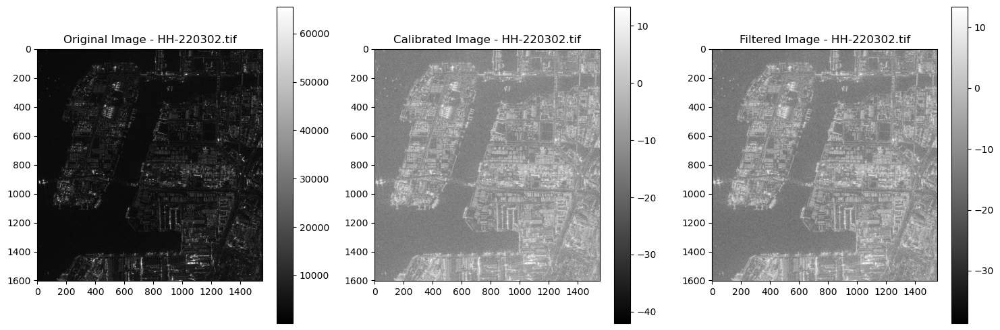

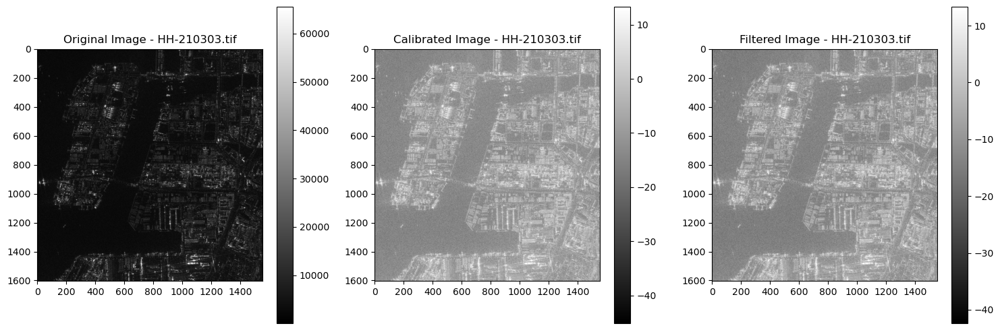

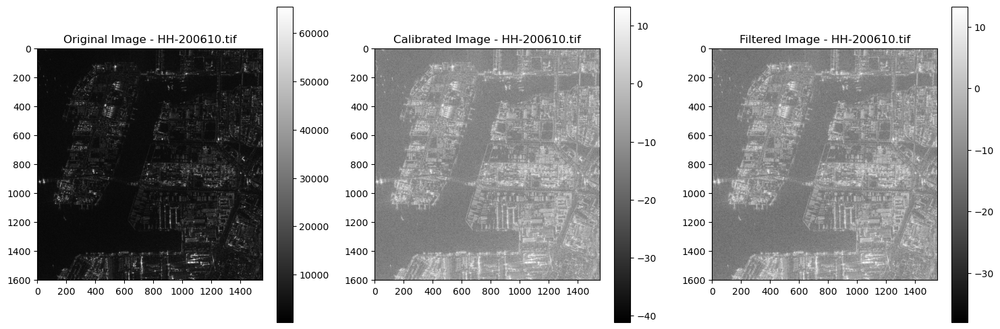

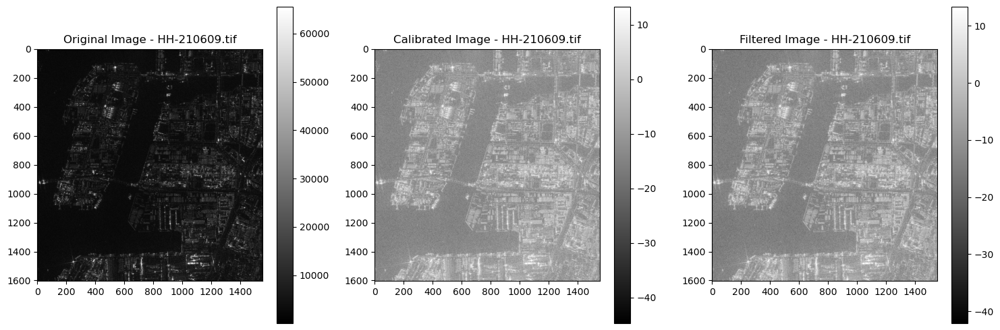

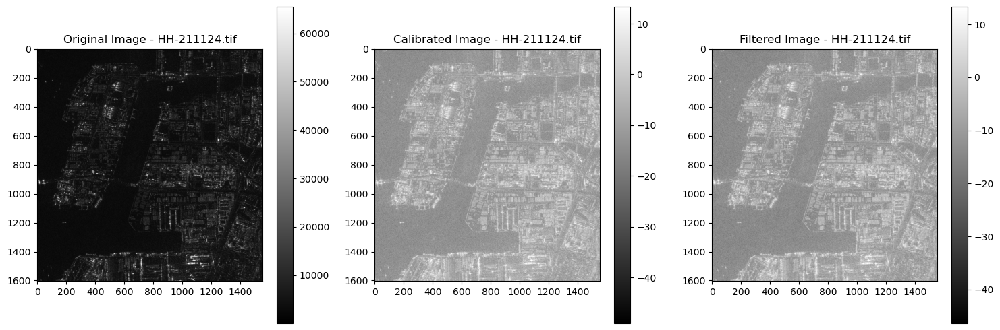

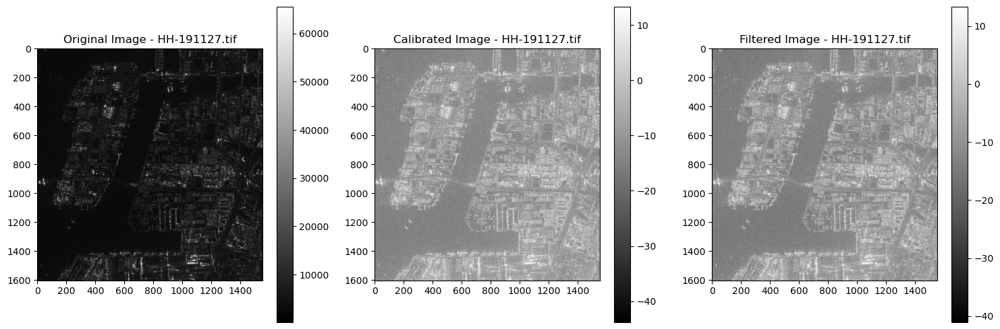

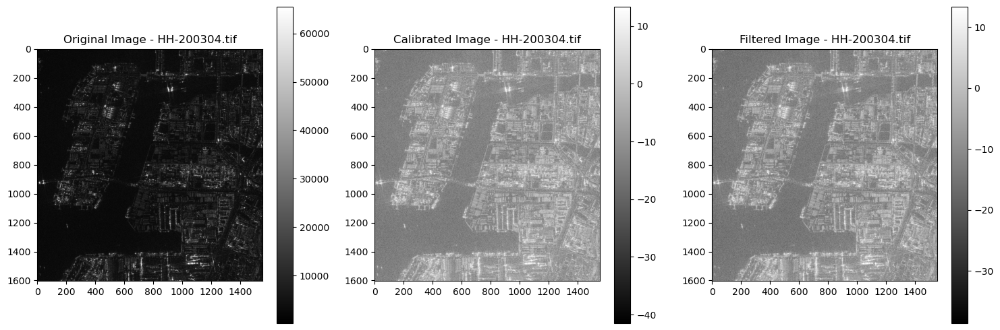

In [9]:
import matplotlib.pyplot as plt
import os
import rasterio

# オリジナル画像、キャリブレーション画像、フィルタリング画像を並べて表示
for alos_path in alos_files:
    # オリジナル画像、キャリブレーション済み画像、フィルター済み画像の取得
    with rasterio.open(alos_path) as src:
        alos_image = src.read(1)
    calibrated_image = calibrated_images[alos_path]
    filtered_image = filtered_images[alos_path]

    # プロット
    plt.figure(figsize=(15, 5))

    # オリジナル・イメージ
    plt.subplot(1, 3, 1)
    plt.imshow(alos_image, cmap='gray')
    plt.title(f"Original Image - {os.path.basename(alos_path)}")
    plt.colorbar()

    # キャリブレーション画像
    plt.subplot(1, 3, 2)
    plt.imshow(calibrated_image, cmap='gray')
    plt.title(f"Calibrated Image - {os.path.basename(alos_path)}")
    plt.colorbar()

    # フィルター画像
    plt.subplot(1, 3, 3)
    plt.imshow(filtered_image, cmap='gray')
    plt.title(f"Filtered Image - {os.path.basename(alos_path)}")
    plt.colorbar()

    plt.tight_layout()
    plt.show()


**フィルタリングされた画像を GeoTIFF ファイルとしてエクスポートする。**

In [10]:
import rasterio

# フィルタリングされたGeoTIFF画像を保存する出力パスを定義する。
output_folder = '/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img'

# 出力フォルダが存在することを確認する
os.makedirs(output_folder, exist_ok=True)

# フィルタリングした画像をGeoTIFFとして書き出す
for alos_path, filtered_image in filtered_images.items():
    output_filename = os.path.join(output_folder, os.path.basename(alos_path).replace('.tif', '_filtered.tif'))
    
    with rasterio.open(alos_path) as src:
        # 元画像からメタデータを取得
        meta = src.meta.copy()
        meta.update({
            'height': filtered_image.shape[0],
            'width': filtered_image.shape[1],
            'dtype': 'float32',  # Change to 'float32' for filtered images
        })
    
    # フィルタリングされた画像を新しいGeoTIFFファイルに書き込む
    with rasterio.open(output_filename, 'w', **meta) as dst:
        dst.write(filtered_image.astype('float32'), 1)  # Write the first band

    print(f"Filtered image saved as: {output_filename}")

Filtered image saved as: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-220302_filtered.tif
Filtered image saved as: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-210303_filtered.tif
Filtered image saved as: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-200610_filtered.tif
Filtered image saved as: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-210609_filtered.tif
Filtered image saved as: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-211124_filtered.tif
Filtered image saved as: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-191127_filtered.tif
Filtered image saved as: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-200304_filtered.tif


## 3.2. ALOS-2衛星によるトヨタ自動車名古屋港施設の可視画像

このセクションの簡単な紹介

- COVID-19危機における生産抑制周辺のいくつかの観測を視覚化する。グーグルアースの高解像度画像と比較する。
- カラー合成で変化を視覚化し、生産抑制との関連性を説明する。
- TOYOTAにおける生産抑制を示すサンプル地点/地域の時系列プロファイルを示す。

### 3.2.1 COVID-19危機下の生産抑制周辺のいくつかの観測を視覚化する。グーグルアースの高解像度画像と比較する。

**フィルタリングされた画像を視覚化する**。

Filtered ALOS-2 files to visualize:
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-220302_filtered.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-210303_filtered.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-200610_filtered.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-210609_filtered.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-211124_filtered.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-191127_filtered.tif
/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-200304_filtered.tif


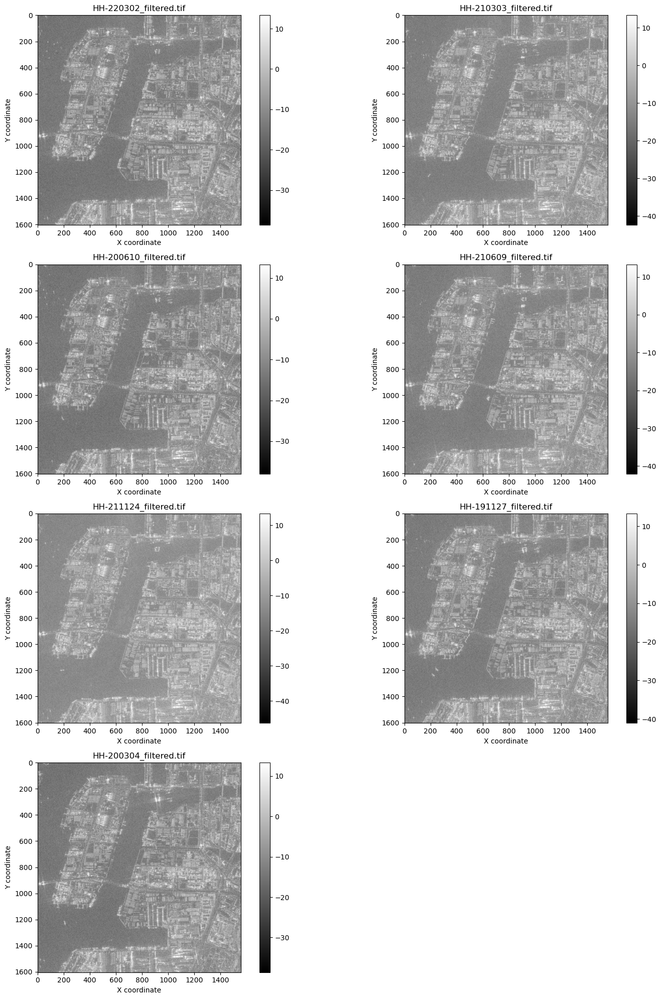

In [11]:
import os
import rasterio
import matplotlib.pyplot as plt

# フィルタリングされた画像を含むフォルダへのパスを定義する
filtered_images_folder = '/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img'

# フォルダ内のすべてのGeoTIFFファイルを検索する
filtered_files = [os.path.join(filtered_images_folder, f) for f in os.listdir(filtered_images_folder) if f.endswith('.tif')]
if not filtered_files:
    raise FileNotFoundError("No GeoTIFF files found in the specified directory.")

# 見つかったファイルのリストを表示する
print("Filtered ALOS-2 files to visualize:")
for file in filtered_files:
    print(file)

# カラーマップを選ぶ
color_map = 'gray'  # 必要に応じてカラーマップを変更できる

# サブプロットに必要な行数を決める
num_images = len(filtered_files)
num_columns = 2
num_rows = (num_images + num_columns - 1) // num_columns  # 行を得るための天井分割

# Create a figure with subplots
plt.figure(figsize=(15, num_rows * 5))  # 行数に応じて図のサイズを調整する

# フィルタリングされた各ファイルをループし、サブプロットに追加する。
for i, filtered_path in enumerate(filtered_files):
    with rasterio.open(filtered_path) as src:
        filtered_image = src.read(1)  # 最初のバンドを読む（シングルバンドのデータを想定）

    # 各画像にサブプロットを作成する
    plt.subplot(num_rows, num_columns, i + 1)
    plt.imshow(filtered_image, cmap=color_map)
    plt.colorbar()
    plt.title(f"{os.path.basename(filtered_path)}")
    plt.xlabel("X coordinate")
    plt.ylabel("Y coordinate")

# 重ならないようにレイアウトを調整
plt.tight_layout()
plt.show()


**Sentinel-2の画像と観測結果を比較する。**

一致する日付のこれら2つのソースからの観測を比較することで、サンプリングされた場所の特徴や土地被覆が時間とともにどのように変化したかを分析することができます。これにより、1つのデータタイプだけでは見えない微妙な変化を浮き彫りにすることができます。

- ALOS-2（SAR）： これらの画像は、天候や照明条件に関係なく、地表の変化や構造に関する洞察を提供する。3つの日付（191127年、210303年、220302年）から、危機前、危機中、危機後のインフラや表面の粗さの変化を追跡することができます。
- Sentinel-2（光学）： これらの画像は、可視および近赤外バンドの反射率をキャプチャします。Sentinel-2の画像（2019年11月、2021年3月、2022年3月）を比較することで、興味深い地域周辺の土地被覆の変化や活動に関する洞察が得られます。

|The observations (ALOS-2 image : 191127)|
|-------------------------------|
|![ALOS-2_1](9fil191127.png)|

| ALOS-2 image (filtered image) | Sentinel-2 image (Nov19) |
|-------------------------------|------------------|
| A |
| ![ALOS-2_A](9fil_1.png) | ![Sentinel-2_A](9fil_2.png) |
| B |
| ![ALOS-2_B](9fil_3.png) | ![Sentinel-2_B](9fil_4.png) |
| C |
| ![ALOS-2_C](9fil_5.png) | ![Sentinel-2_C](9fil_6.png) |

|The observations (ALOS-2 image : 210303)|
|-------------------------------|
|![ALOS-2_1](10fil210303.png)|

| ALOS-2 image (filtered image) | Sentinel-2 image (Mar21) |
|-------------------------------|------------------|
| A |
| ![ALOS-2_A](10fil_1.png) | ![Sentinel-2_A](10fil_2.png) |
| B |
| ![ALOS-2_B](10fil_3.png) | ![Sentinel-2_B](10fil_4.png) |
| C |
| ![ALOS-2_C](10fil_5.png) | ![Sentinel-2_C](10fil_6.png) |

|The observations (ALOS-2 image : 220302)|
|-------------------------------|
|![ALOS-2_1](11fil220302.png)|

| ALOS-2 image (filtered image) | Sentinel-2 image (Mar22) |
|-------------------------------|------------------|
| A |
| ![ALOS-2_A](11fil_1.png) | ![Sentinel-2_A](11fil_2.png) |
| B |
| ![ALOS-2_B](11fil_3.png) | ![Sentinel-2_B](11fil_4.png) |
| C |
| ![ALOS-2_C](11fil_5.png) | ![Sentinel-2_C](11fil_6.png) |

### 3.2.2 カラー合成で変化を可視化し、生産抑制との関連性を説明する。

時間 RGB 合成画像の作成は、複数の SAR 画像の違いを可視化するのに便利です。ここでは ALOS-2 の画像を扱っているため、RGB チャンネルに異なるバンドやタイムスタンプ画像を割り当てるのが一般的な手法です。

赤、緑、青の各チャンネルにフィルタリングされた2つの画像を合成することで、RGB合成画像を作成することができます。2つの画像があるので、1つの画像を赤チャンネルに、もう1つの画像を緑チャンネルに割り当て、青チャンネルにはそれらの平均か空の配列を使うという方法もあります。

**擬似カラー合成順** 1.

1. 3つの画像、または2つの画像を使用し、合成された第3のチャンネルを作成する（平均化など）。
2. これらを赤、緑、青チャンネルに割り当てる。
3. RGB画像として表示されるように、ピクセル値を[0, 1]の範囲になるように正規化する。
4. matpotlib を使って偽色合成を表示します。

注意：red_channel、green_channel、blue_channelは、強調したいデータや分析の側面に応じて、好きなフィルター画像パスに置き換えることができます。

Index 0: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-191127_filtered.tif (Date: 191127)
Index 1: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-200304_filtered.tif (Date: 200304)
Index 2: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-200610_filtered.tif (Date: 200610)
Index 3: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-210303_filtered.tif (Date: 210303)
Index 4: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-210609_filtered.tif (Date: 210609)
Index 5: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-211124_filtered.tif (Date: 211124)
Index 6: /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img1/HH-220302_filtered.tif (Date: 220302)


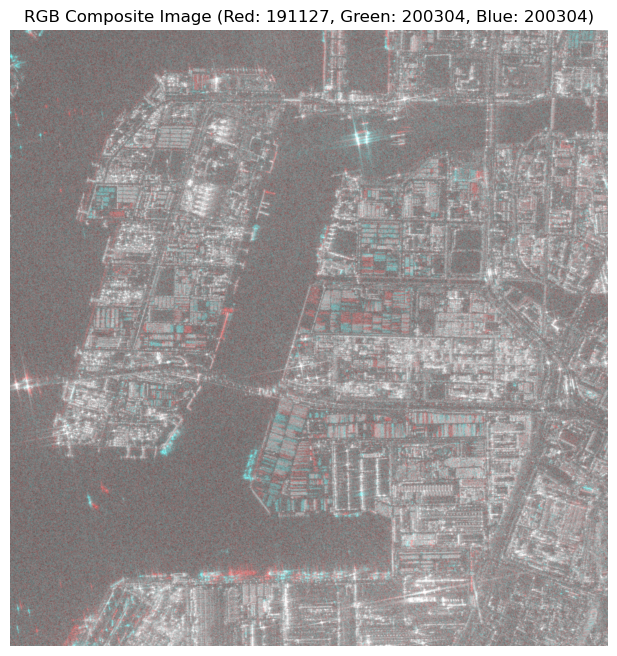

In [12]:
import re
import rasterio
import numpy as np
import matplotlib.pyplot as plt

# filtered_filesをファイル・パスのリストと仮定する。
filtered_files = [
    "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-191127_filtered.tif",
    "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-200304_filtered.tif",
    "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-200610_filtered.tif",
    "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-210303_filtered.tif",
    "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-210609_filtered.tif",
    "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-211124_filtered.tif",
    "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-220302_filtered.tif"
]
    
# ファイル名から日付を抽出する
def extract_date(filename):
    # 日付をキャプチャする正規表現パターン（例：'191127'）
    match = re.search(r'\d{6}', filename)
    return match.group(0) if match else "Unknown date"

# 各ファイルのインデックスと日付を印刷する
for index, file in enumerate(filtered_files):
    date = extract_date(file)
    print(f"Index {index}: {file} (Date: {date})")

# 使用する2つの画像のインデックスを指定する。
red_index = 0  # 赤チャンネルの画像インデックス
green_index = 1  # 緑チャンネルの画像インデックス
blue_index = 1  # グリーン・チャンネルの画像をブルー・チャンネルに再利用する。

# 指定したチャンネルの画像を読み込む
with rasterio.open(filtered_files[red_index]) as src_red:
    red_channel = src_red.read(1)
with rasterio.open(filtered_files[green_index]) as src_green:
    green_channel = src_green.read(1)
with rasterio.open(filtered_files[blue_index]) as src_blue:
    blue_channel = src_blue.read(1)

# RGB可視化のためにチャンネルを範囲[0, 1]に正規化する。
def normalize(image):
    return (image - image.min()) / (image.max() - image.min())

# 正規化を適用する
red_channel_norm = normalize(red_channel)
green_channel_norm = normalize(green_channel)
blue_channel_norm = normalize(blue_channel)

# 正規化されたチャンネルをスタックしてRGB合成画像を作成する。
rgb_composite = np.stack((red_channel_norm, green_channel_norm, blue_channel_norm), axis=-1)

# チャンネルの日付を取得する
red_date = extract_date(filtered_files[red_index])
green_date = extract_date(filtered_files[green_index])
blue_date = extract_date(filtered_files[blue_index])

# RGBコンポジットの可視化
plt.figure(figsize=(8, 8))
plt.imshow(rgb_composite)
plt.title(f"RGB Composite Image (Red: {red_date}, Green: {green_date}, Blue: {blue_date})")
plt.axis('off')
plt.show()


**Pythonを使用したRGB合成の視覚化の説明**

RGB合成画像は、191127年と200304年に撮影された2枚のALOS-2 SAR画像間の時間的変化を強調して表示します。コンポジットでは、2つの日付の間で変化していない領域がグレースケールで表示され、RGBの組み合わせの結果となっています。赤い領域は、191127年にのみ物体や構造物が存在していた領域を示しており、200304年までに除去されたか変化したことを示唆している。逆に、青い領域は、200304年の画像にのみ物体が出現した領域を示し、この間に発生した新たな発展や変化を示している。このような可視化により、フィルター処理された画像を使用して、インフラ、土地利用、その他の特徴の経時的変化を効果的に強調し、正確な変化を検出することができる。

### 3.2.3 TOYOTA の前兆抑制を示すサンプリング位置/領域の時系列プロファイルを表示する。

このコードは、時系列ラスター画像をスタックして、ALOS-2 後方散乱データの時間変化を解析する。スタックされたラスターデータ上で各AOIのジオメトリをマスクすることにより、各時間レイヤーの後方散乱の中央値を計算する。時間層は可視化のために様々な日付のALOS-2画像に対応している。その結果はプロットされ、各AOIの経時的な後方散乱の傾向を示し、反射表面特性の変化を追跡することができ、AOI内の表面状態の変化を示す可能性があります。

**ALOSデータの時系列データを合成し、変化を把握する**。

TOYOTAの前駆抑制を示すサンプリング地点/領域の時系列プロファイルを示す。

時系列スタックの合成は、異なる日付の複数のALOS-2画像を1つのマルチレイヤー画像に合成します。このように、各レイヤーは特定の日付のデータを表しているため、時間的な変化を分析することができます。

In [13]:
import rasterio
import numpy as np
import os

# フィルタリングされた画像を含むディレクトリへのパス
filtered_images_path = '/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img'

# フィルタリングされた画像を一貫した形式で保存するためのリストを初期化する。
filtered_stack = []

# フィルタリングされたすべての画像をスタックに集める
for filename in os.listdir(filtered_images_path):
    if filename.endswith('.tif'):  # 画像のフォーマットが異なる場合は調整してください。
        image_path = os.path.join(filtered_images_path, filename)
        with rasterio.open(image_path) as src:
            filtered_image = src.read(1)  # 最初のバンドを読む（2D）
            filtered_stack.append(filtered_image)

# リストをnumpyの3次元配列に変換（高さ、幅、時間）
time_series_stack = np.stack(filtered_stack, axis=-1)

# スタックの基本情報を表示する
print("Time-Series Stack Shape (Height, Width, Time):", time_series_stack.shape)
print("Number of Layers (Time Dimension):", time_series_stack.shape[-1])


Time-Series Stack Shape (Height, Width, Time): (1604, 1556, 7)
Number of Layers (Time Dimension): 7


**時系列スタックを GeoTIFF としてエクスポートする。**

In [14]:
import rasterio
import os

# ALOSファイルのパスを保存するリストを初期化する。
alos_files = []

# フィルタリングされたすべての画像をalos_filesに集める
for filename in os.listdir(filtered_images_path):
    if filename.endswith('.tif'):  # Adjust this if your images are in a different format
        alos_files.append(os.path.join(filtered_images_path, filename))

# 出力 GeoTIFF のエクスポートパスを定義する。
output_path = 'alos2_time_series_stack_ngo1.tif'

# メタデータを取得するためにソース画像の1つを開く
with rasterio.open(alos_files[0]) as src:
    # 既存のファイルからメタデータをコピーし、カウントを更新する。
    metadata = src.meta.copy()
    metadata.update({
        'count': time_series_stack.shape[-1],  # レイヤー数をカウントする（時間次元）
        'dtype': 'float32'                     # データタイプの設定
    })

# マルチレイヤーの時系列スタックを GeoTIFF ファイルに書き込む
with rasterio.open(output_path, 'w', **metadata) as dst:
    for i in range(time_series_stack.shape[-1]):
        # 各層を別々のバンドとして書く
        dst.write(time_series_stack[:, :, i].astype('float32'), i + 1)

print(f"Time-Series Stack successfully exported to {output_path}")


Time-Series Stack successfully exported to alos2_time_series_stack_ngo2.tif


![Stacked layer](1stacked.png)

ALOS-2画像のスタッキングは、同じエリアで異なる時刻に撮影された複数のSAR画像を1つのマルチレイヤーファイルに結合します。以下は、スタック画像の出力を色分けしたものです：

**白黒： 。
これらは、その画素の時系列を通して変化がなかったことを示す。

この場合、黒と白の色調は、積み重ね画像でカバーされている時間スパンにおいて、大きな変化が発生していないエリアを示します。これらの領域は安定しており、一貫した活動レベルまたは変化していない地表の状態を示唆している。

** 色：***。
これらの色は、変化のあった地域を示している。スタックされたレイヤーは複数の時間レイヤーを含んでいるため、値は有意な変化が発生した時間レイヤーのインデックスを表しています。

一方、複数の色で表された領域は、変化が発生した場所を強調する。これらの変化は後方散乱値で検出され、コンテナ量の増加、港湾業務のシフト、産業活動の変化など、表面特性の変化を示している可能性があります。

In [15]:
pip install geopandas

Note: you may need to restart the kernel to use updated packages.


In [16]:
import rasterio
import rasterio.features  # 機能を明示的にインポートする
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd

**処理に必要なパスとパラメータを定義する**

- ALOS-2 スタック画像と AOI (Area of Interest) ファイルのファイルパスを指定する(自分でAOIファイルを作成するか、ここからダウンロードしてくださいhttps://owncloud.glodal-inc.net/owncloud/index.php/s/xPdaXgH00OwQKFQ)。
- 積み重ねられたイメージの各バンドに対応する年を定義し、模倣された時点を作成して下さい

In [17]:
stacked_image_path = '/home/jovyan/shared/Sirinya/alos/ALOS2.1/alos2_time_series_stack_ngo1.tif'
aoi_paths = [
    '/home/jovyan/shared/Sirinya/alos/ALOS2.1/aoi_toyota.gpkg'
]
years = [191127, 200304, 200610, 210303, 210609, 211124, 220302]  # 画像の収集日
time_points = np.arange(0, len(years) * 7, 7)  # 時間間隔は7日の倍数

**積層 ALOS-2 画像データの読み込み**

- 積層されたALOS-2画像を開き、すべてのバンド（レイヤー）を3D numpy配列に読み込みます。
- 各バンドはシリーズの異なる時点を表す。

In [18]:
with rasterio.open(stacked_image_path) as src:
    stacked_data = src.read()  # stacked_dataは形状を持つ（バンド、高さ、幅）

**各 AOI を処理して後方散乱の中央値を計算する**。
- 各 AOI ファイルをループする。各 AOI について、AOI ジオメトリに基づいてマスクを作成し、関心領域を分離します。
- スタック画像の各時点（バンド）について、AOI 内の後方散乱値の中央値を計算します。

In [19]:
median_values_all = {}  # 各 AOI の中央値を格納する辞書

for aoi_path in aoi_paths:
    # ジオパンダを使用して AOI ジオメトリをロードする。
    aoi_gdf = gpd.read_file(aoi_path)
    
    # すべてのジオメトリを組み合わせて、AOI 全体の空のマスクを初期化する。
    combined_mask = np.zeros(stacked_data.shape[1:], dtype=bool)
    for geom in aoi_gdf.geometry:
        # ジオメトリが有効な場合は、スタック画像の解像度に合わせてラスタライズする。
        if geom.is_valid:
            mask = rasterio.features.geometry_mask([geom], transform=src.transform,
                                                   invert=True, out_shape=combined_mask.shape)
            combined_mask = np.logical_or(combined_mask, mask)

    # 各バンド（時点）の後方散乱値の中央値を計算する
    median_values = []
    for band in range(stacked_data.shape[0]):
        band_data = stacked_data[band]  # 現在のバンドのデータを抽出する
        # マスク領域の中央値を計算する
        median_value = np.median(band_data[combined_mask])
        median_values.append(median_value)

    # 現在のAOIの中央値を保存する
    aoi_name = aoi_path.split('/')[-1].split('.')[0]  # パスからAOI名を抽出する
    median_values_all[aoi_name] = median_values


**各 AOI の経時的な中央値をプロットする。**

- 計算されたAOIの後方散乱中央値を経時的にプロットする。X軸は時間間隔と日付
- y軸は後方散乱の中央値をdBで表す。

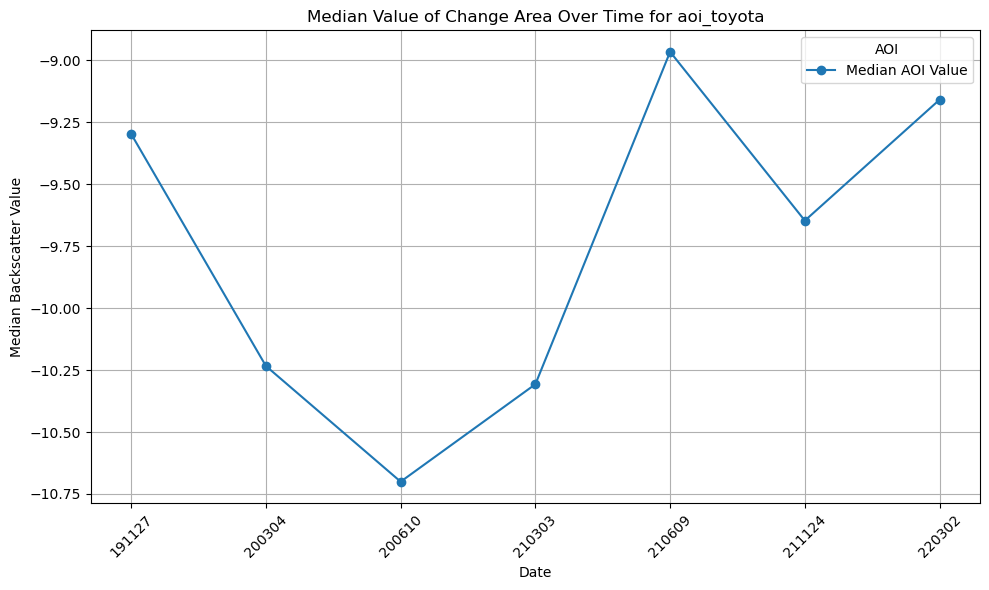

In [20]:
for aoi_name, median_values in median_values_all.items():
    plt.figure(figsize=(10, 6))
    plt.plot(time_points, median_values, marker='o', label='Median AOI Value')

    plt.title(f'Median Value of Change Area Over Time for {aoi_name}')
    plt.xlabel('Date')
    plt.ylabel('Median Backscatter Value')
    plt.xticks(time_points, labels=years, rotation=45)  # Display original years as labels
    plt.grid()
    plt.legend(title='AOI')
    plt.tight_layout()
    plt.show()

**全体的な傾向：**
このグラフは、トヨタの生産指標の全般的な低下傾向を示しており、すべての日付でマイナス値が示されているが、期間を通じて多少の変動がある。この減少傾向は、生産能力に大きな影響を与えたCOVID-19の混乱と半導体不足の影響と関連していると思われる。生産回復に向けたトヨタの努力は目に見える形で現れているが、データ・ポイントは、特に国内事業における継続的な課題を示唆している。

**時系列観測：**
- 191127年から200304年：初期のパンデミック関連の混乱とCOVID-19の初期波によるものと思われる。
- 200304年から200610年まで： 200304年から200610年：さらに減少しており、パンデミック問題の深刻化と、おそらく初期の世界的なチップ不足に一致して、生産への影響が深まっていることを示している。
- 200610～210303年：わずかな回復と増加。これは、パンデミックの影響が続いているにもかかわらず、トヨタが通常生産の再開を目指したことによるわずかな改善を示唆している。
- 210303年から210609年まで：COVID-19の混乱が断続的に続いたが、この期間の生産調整と回復の試みを示唆するプラスの変化。
- 210609年から211124年：COVID-19の再流行とサプライチェーンの制約がトヨタの生産に影響を及ぼしたためとみられる。
- 211124年から220302年まで： 最後のポイントは、供給問題が安定し始め、トヨタの生産戦略が継続的な制約に適応する可能性があることから、段階的な回復を示唆している。

**概要**

このデータポイントは、COVID-19と世界的なチップ不足を通じて生産を安定させようとするトヨタの苦闘を示している。初期の落ち込みはパンデミックの深刻な影響を反映しているが、その後の日付では、トヨタが中国の封鎖環境が緩和する中で操業を再開したため、若干の改善が見られる。工場での一時的な操業停止や人手不足による生産能力の低下が、このような変動の一因となった。トヨタの国内生産は、世界的な需要回復が期待されるにもかかわらず、グラフの度重なる落ち込みに象徴されるように、持続的な課題に直面している。トヨタの生産見通しは、長引く半導体不足やパンデミック（世界的大流行病）の流行に対応するため、慎重ながらも楽観的であり、今後数四半期で徐々に回復する可能性がある。

## 3.3. COVID-19 危機における港湾事業の変化検出

- 危機前，危機中，危機後（利用可能な場合）のオブザベーションをサンプリングする．
- 2つのオブザベーション間の差を計算する．
     - 危機前と危機中：TOYOTAの生産後退
     - 危機前と危機後：TOYOTA の生産の回復
- Google Earthの過去の画像で、サンプリングした場所の変化を検証する。

### 3.3.1 危機発生前、危機発生中、危機発生後のサンプル観測値

これらの画像は、COVID-19パンデミックにおけるトヨタの活動の主要な段階を表すものとして、以下の記事で紹介されている：

- 危機前（191127年）： この日付は2019年11月27日で、パンデミックの影響が日本に及ぶ前の状況を捉えたベースライン画像となっている。
- インクライシス（200610）： 2020年6月10日の画像は、COVID-19に関連した減産、（チップ不足などの）サプライチェーンの混乱、健康への適応などの影響を受け、特に日本の製造業や自動車産業で混乱が最高潮に達した時期と一致している。このタイミングは、トヨタが危機の間に直面した経営上の課題についての洞察を提供する。
- 危機後（211124年）： 2021年11月24日までに、日本は回復に向かって移行していた。トヨタをはじめとするメーカー各社は回復の兆しを見せたが、COVID-19の断続的な発生や残存部品の不足が依然として課題となっていた。この画像は、トヨタのフル稼働に向けた慎重ながらも緩やかな動きを反映してい注：ote: 
- [Toyota suspends some Japan factory output over COVID outbreak](https://www.reuters.com/business/autos-transportation/toyota-suspends-some-japan-factory-output-over-covid-outbreak-2022-07-27/)
- [Toyota misses April-June output target but says may be turning corner](https://www.reuters.com/business/autos-transportation/toyotas-april-june-global-vehicle-production-falls-98-short-initial-target-2022-07-28/)
- [Toyota suspends some Japan factory production due to COVID outbreak](https://www.reuters.com/business/autos-transportation/toyota-suspends-some-japan-factory-production-due-covid-outbreak-2022-08-09/)

**画像のファイルパスを定義する**。

pre_crisis、in_crisis、post_crisisイメージのファイルパスを定義します。これらのプレースホルダーを、システム上の実際のパスに置き換えてください。

In [21]:
# ALOS-2画像へのパス
pre_crisis_image_path = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-191127_filtered.tif"
in_crisis_image_path = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-200610_filtered.tif"
post_crisis_image_path = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-211124_filtered.tif"

**画像を読み込んで正規化する関数の定義**

read_image 関数の目的： 画像を開き、データを読み込んで、より良い視覚化のために正規化する。

In [22]:
# 画像を読み込んで正規化する関数を作る
def read_image(image_path):
    with rasterio.open(image_path) as src:
        image_data = src.read(1)  # Read the first band
        image_data = (image_data - image_data.min()) / (image_data.max() - image_data.min())  # Normalize to [0, 1]
    return image_data

**画像の読み取りと正規化**



In [23]:
# 画像を読み取り、正規化する
pre_crisis = read_image(pre_crisis_image_path)
in_crisis = read_image(in_crisis_image_path)
post_crisis = read_image(post_crisis_image_path)

**映像の視覚化**

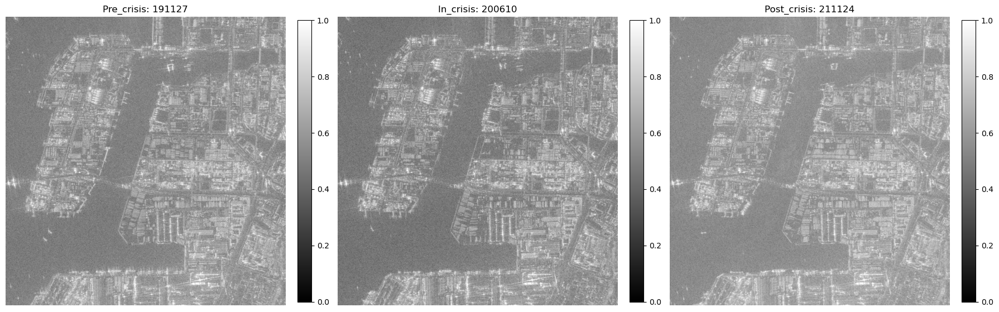

In [24]:

# 視覚化のために図を設定する
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 各画像をカラーバーでプロットする
im1 = axes[0].imshow(pre_crisis, cmap='gray')
axes[0].set_title("Pre_crisis: 191127")
axes[0].axis("off")
fig.colorbar(im1, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

im2 = axes[1].imshow(in_crisis, cmap='gray')
axes[1].set_title("In_crisis: 200610")
axes[1].axis("off")
fig.colorbar(im2, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

im3 = axes[2].imshow(post_crisis, cmap='gray')
axes[2].set_title("Post_crisis: 211124")
axes[2].axis("off")
fig.colorbar(im3, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

# レイアウトを調整し、プロットを表示する
plt.tight_layout()
plt.show()



### 3.3.2 2つの観測値の差の計算

- この節では、COVID-19 の危機前と危機中の差を計算するために、191127 と 200610 の画像を使用する。
- COVID-19の危機前と危機後の差は、200610年と211124年の画像を用いる。

#### A. 危機以前と危機以後：トヨタ生産の後退

In [25]:
# ALOS-2画像へのパス
pre_crisis_image_path = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-191127_filtered.tif"
in_crisis_image_path = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-200610_filtered.tif"

In [26]:
# 画像を開き、データを読み込む
with rasterio.open(pre_crisis_image_path) as src_pre:
    pre_crisis_data = src_pre.read(1)  # Read the first band
    pre_crisis_meta = src_pre.meta  # Store metadata for output
    pre_crisis_crs = src_pre.crs  # Store CRS

with rasterio.open(in_crisis_image_path) as src_in:
    in_crisis_data = src_in.read(1)  # Read the first band

In [27]:
# 画像を読む
pre_crisis = read_image(pre_crisis_image_path)
in_crisis = read_image(in_crisis_image_path)

**画像が同じ形状であることを確認**

ピクセル単位の差分計算に必要な、画像の寸法が一致していることを確認します。.

In [28]:
# 両方の画像が同じ形状であることを確認する
if pre_crisis_data.shape != in_crisis_data.shape:
    raise ValueError("The two images must have the same dimensions.")

**危機前と危機後の差を計算**

危機前画像の各ピクセルから危機後画像の対応するピクセルを差し引く。

In [29]:
# 差額を計算する
difference_caseA = in_crisis_data - pre_crisis_data

**差分画像の視覚化**

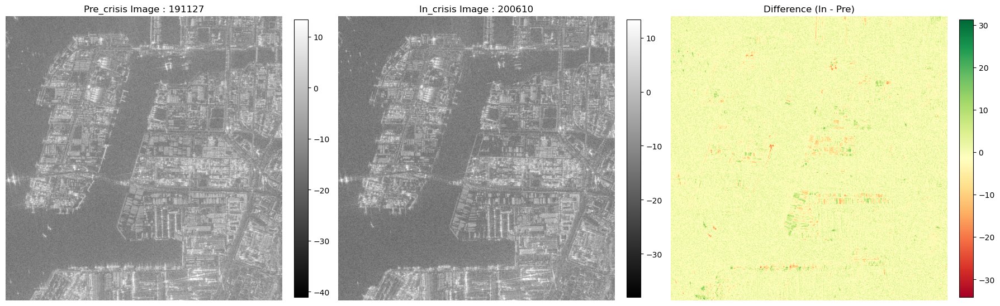

In [30]:

# 視覚化のために図を設定する
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# 危機前の画像をカラーバーでプロットする。
im1 = axes[0].imshow(pre_crisis_data, cmap='gray')
axes[0].set_title("Pre_crisis Image : 191127")
axes[0].axis("off")
fig.colorbar(im1, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

# in_crisis 画像をカラーバーでプロットする。
im2 = axes[1].imshow(in_crisis_data, cmap='gray')
axes[1].set_title("In_crisis Image : 200610")
axes[1].axis("off")
fig.colorbar(im2, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

# 差分画像をカラーバーでプロットする
im3 = axes[2].imshow(difference_caseA, cmap='RdYlGn')
axes[2].set_title("Difference (In - Pre)")
axes[2].axis("off")
fig.colorbar(im3, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

# レイアウトを調整し、プロットを表示する
plt.tight_layout()
plt.show()


**差分画像（分類前）のヒストグラムを平均値と中央値でプロットする。**

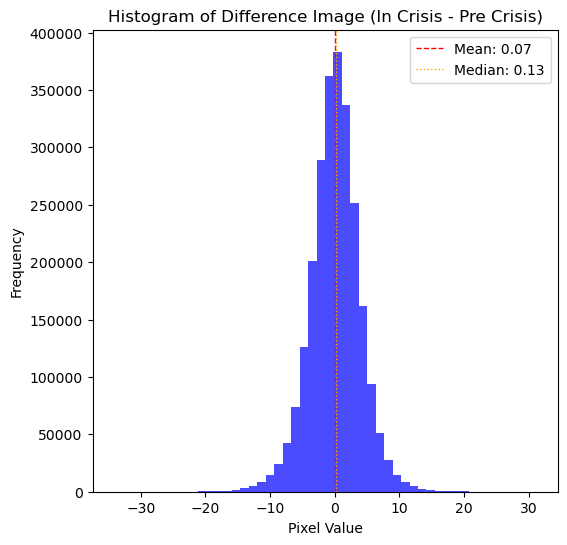

In [31]:

# 以下の変数が定義されていると仮定する：
# 危機前のデータ、危機中のデータ

# ケースA：危機内データと危機前データの違い
difference_caseA = in_crisis_data - pre_crisis_data

# ケース1の平均値、中央値、標準偏差を計算する。
mean_diff_caseA = np.mean(difference_caseA)
median_diff_caseA = np.median(difference_caseA)
std_diff_caseA = np.std(difference_caseA)

# ケースAのプロット・ヒストグラム
plt.figure(figsize=(6, 6))
plt.hist(difference_caseA.ravel(), bins=50, color='blue', alpha=0.7)
plt.axvline(mean_diff_caseA, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_diff_caseA:.2f}')
plt.axvline(median_diff_caseA, color='orange', linestyle='dotted', linewidth=1, label=f'Median: {median_diff_caseA:.2f}')
plt.title("Histogram of Difference Image (In Crisis - Pre Crisis)")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.legend()
plt.show()


**分類しきい値の定義と分類の適用**

このコードは、画像（difference_caseA）の各ピクセルを、平均ピクセル値との差に基づいて3つのクラスのいずれかに分類する。ピクセルをクラスに分類することで、明確な変化を持つ領域を強調することができます。この分類は、各ピクセルを平均値プラスマイナス1標準偏差と比較することで、変化のない領域、プラスの変化、マイナスの変化の領域を識別するのに役立つ。このアプローチは、経時変化をモニターするのに便利である。

各クラスは、平均値に対する異なるレベルの変化を表す：

- **変更なし (Class 1)**: 値1に割り当てられたピクセルは、平均値の1標準偏差以内の値を持つ。これらのピクセルは、変化が最小限である領域を表し、安定または有意な変化がないことを示す。
- **ポジティブな変化 (Class 2)**: 値が2のピクセルは、平均より1標準偏差以上高い。これらのピクセルは、信号強度の増加またはその領域での何らかの新しい活動を示唆する、正の変化の領域を表す。
- **マイナスの変化 (Class 3)**: 値が3のピクセルは、平均値より1標準偏差以上低く、負の変化の領域を表す。これは、活動の減少、対象物の除去、またはその他の信号強度の低下を示している可能性がある。

In [32]:
classified_image_caseA = np.zeros_like(difference_caseA)  # 分類配列の初期化

# クラス1：変化なし（平均値の1標準偏差以内）
classified_image_caseA[(difference_caseA > mean_diff_caseA - std_diff_caseA) & 
                       (difference_caseA <= mean_diff_caseA + std_diff_caseA)] = 1  

# クラス2：ポジティブな変化（平均より1標準偏差以上大きい）
classified_image_caseA[difference_caseA > mean_diff_caseA + std_diff_caseA] = 2  

# クラス3：マイナスの変化（平均より1標準偏差以上低い）
classified_image_caseA[difference_caseA < mean_diff_caseA - std_diff_caseA] = 3


**クラシファイドイメージの視覚化**

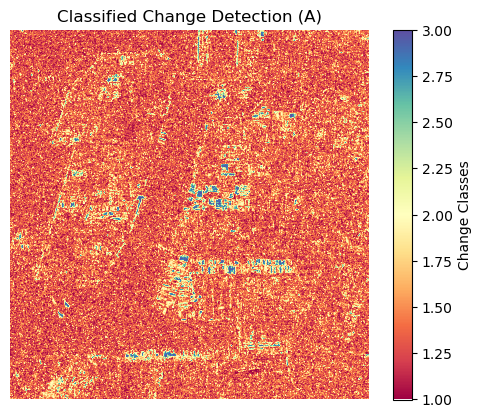

In [33]:
# 分類された画像を表示する
plt.imshow(classified_image_caseA, cmap='Spectral')
plt.colorbar(label="Change Classes")
plt.title("Classified Change Detection (A)")
plt.axis("off")
plt.show()

**分類された画像のヒストグラムを平均値と中央値でプロットする。**

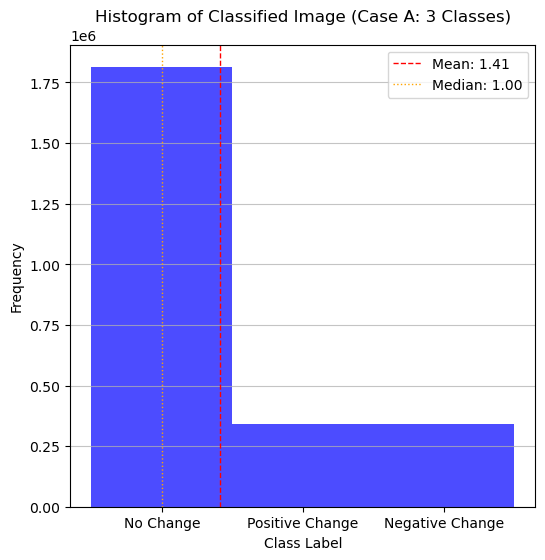

In [34]:
# ケースAについて、分類された画像（クラスラベル）の平均値と中央値を計算する。
mean_classified_caseA = np.mean(classified_image_caseA)
median_classified_caseA = np.median(classified_image_caseA)

# ケースAの分類画像のヒストグラムをプロットする。
plt.figure(figsize=(6, 6))
plt.hist(classified_image_caseA.ravel(), bins=np.arange(1, 5) - 0.5, color='blue', alpha=0.7)
plt.axvline(mean_classified_caseA, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_classified_caseA:.2f}')
plt.axvline(median_classified_caseA, color='orange', linestyle='dotted', linewidth=1, label=f'Median: {median_classified_caseA:.2f}')
plt.title("Histogram of Classified Image (Case A: 3 Classes)")
plt.xlabel("Class Label")
plt.ylabel("Frequency")
plt.xticks([1, 2, 3], ['No Change', 'Positive Change', 'Negative Change'])
plt.legend()
plt.grid(axis='y', alpha=0.75)  # Optional: Add grid lines for better readability
plt.show()


**差分画像と分類画像をGeoTIFFとして保存**

In [35]:
# ケースAの画像を保存するパス
difference_output_path_caseA = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/pre_in_difference_image_testA.tif"
classified_output_path_caseA = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/classified_change_detection_pre_in_testA.tif"

# GeoTIFFとして保存するためのメタデータの更新
pre_crisis_meta.update({"driver": "GTiff", "count": 1, "dtype": "float32"})

# ケース1の差分画像を保存
with rasterio.open(difference_output_path_caseA, "w", **pre_crisis_meta) as dst:
    dst.write(difference_caseA, 1)  # Write the difference for Case A to the first band

print(f"Difference image for Case A saved to {difference_output_path_caseA}")

# 分類された画像のメタデータを更新（クラスラベルに整数データ型を使用）
classified_meta_caseA = pre_crisis_meta.copy()
classified_meta_caseA.update({"dtype": "int32"})

# ケースAのクラシファイド画像を保存
with rasterio.open(classified_output_path_caseA, "w", **classified_meta_caseA) as dst:
    dst.write(classified_image_caseA, 1)  # Write the classified image for Case A to the first band

print(f"Classified Change Detection image for Case A saved to {classified_output_path_caseA}")


Difference image for Case A saved to /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/pre_in_difference_image_testA.tif
Classified Change Detection image for Case A saved to /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/classified_change_detection_pre_in_testA.tif


#### B: 危機下と危機後：トヨタ自動車の生産回復

In [36]:
# ALOS-2画像へのパス
in_crisis_image_path = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-200610_filtered.tif"
post_crisis_image_path = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/filtered_img/HH-211124_filtered.tif"

In [37]:
# 画像を開き、データを読み込む
with rasterio.open(in_crisis_image_path) as src_pre:
    in_crisis_data = src_pre.read(1)  # 最初のバンドを読む
    in_crisis_meta = src_pre.meta  # 出力のためのメタデータを保存する
    in_crisis_crs = src_pre.crs  # 店舗 CRS

with rasterio.open(post_crisis_image_path) as src_post:
    post_crisis_data = src_post.read(1)  # 最初のバンドを読む

In [38]:
# 画像を読む
in_crisis = read_image(in_crisis_image_path)
post_crisis = read_image(post_crisis_image_path)

In [39]:
# 両方の画像が同じ形状であることを確認する
if in_crisis_data.shape != post_crisis_data.shape:
    raise ValueError("The two images must have the same dimensions.")

**差分の計算**

危機発生時画像の各ピクセルと危機発生後画像の対応するピクセルを差し引き、両画像間の変化を強調する「差分」画像を生成する。

In [40]:
# 差額を計算する
difference_caseB = post_crisis_data - in_crisis_data

**差分画像の視覚化**

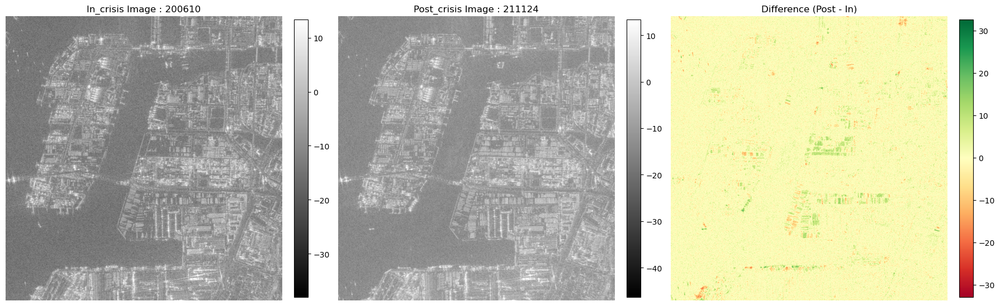

In [41]:

# 視覚化のために図を設定する
fig, axes = plt.subplots(1, 3, figsize=(18, 6))

# in_crisis 画像をカラーバーでプロットする。
im1 = axes[0].imshow(in_crisis_data, cmap='gray')
axes[0].set_title("In_crisis Image : 200610")
axes[0].axis("off")
fig.colorbar(im1, ax=axes[0], orientation='vertical', fraction=0.046, pad=0.04)

# 危機後の画像をカラーバーでプロットする。
im2 = axes[1].imshow(post_crisis_data, cmap='gray')
axes[1].set_title("Post_crisis Image : 211124")
axes[1].axis("off")
fig.colorbar(im2, ax=axes[1], orientation='vertical', fraction=0.046, pad=0.04)

# 差分画像をカラーバーでプロットする
im3 = axes[2].imshow(difference_caseB, cmap='RdYlGn')
axes[2].set_title("Difference (Post - In)")
axes[2].axis("off")
fig.colorbar(im3, ax=axes[2], orientation='vertical', fraction=0.046, pad=0.04)

# レイアウトを調整し、プロットを表示する
plt.tight_layout()
plt.show()


**差分画像（分類前）のヒストグラムを平均値と中央値でプロットする。**

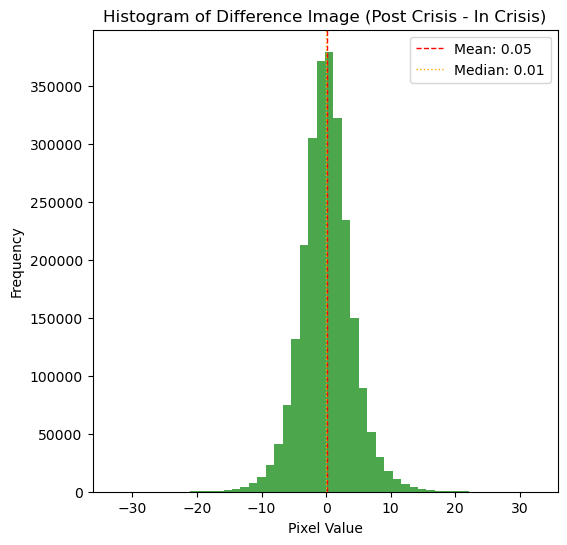

In [42]:
# 以下の変数が定義されていると仮定する：
# 危機後のデータ

# ケースB：危機後のデータと危機中のデータの違い
difference_caseB = post_crisis_data - in_crisis_data

# ケースBの平均、中央値、標準偏差を計算する。
mean_diff_caseB = np.mean(difference_caseB)
median_diff_caseB = np.median(difference_caseB)
std_diff_caseB = np.std(difference_caseB)

# ケースBのプロット・ヒストグラム
plt.figure(figsize=(6, 6))
plt.hist(difference_caseB.ravel(), bins=50, color='green', alpha=0.7)
plt.axvline(mean_diff_caseB, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_diff_caseB:.2f}')
plt.axvline(median_diff_caseB, color='orange', linestyle='dotted', linewidth=1, label=f'Median: {median_diff_caseB:.2f}')
plt.title("Histogram of Difference Image (Post Crisis - In Crisis)")
plt.xlabel("Pixel Value")
plt.ylabel("Frequency")
plt.legend()
plt.show()



**分類しきい値の定義と分類の適用**

このコードは、画像（difference_caseA）の各ピクセルを、平均ピクセル値との差に基づいて3つのクラスのいずれかに分類する。ピクセルをクラスに分類することで、明確な変化を持つ領域を強調することができます。この分類は、各ピクセルを平均値プラスマイナス1標準偏差と比較することで、変化のない領域、プラスの変化、マイナスの変化の領域を識別するのに役立つ。このアプローチは、経時変化をモニターするのに便利である。

各クラスは、平均値に対する異なるレベルの変化を表す：

- **変更なし (Class 1)**: 値1に割り当てられたピクセルは、平均値の1標準偏差以内の値を持つ。これらのピクセルは、変化が最小限である領域を表し、安定または有意な変化がないことを示す。
- **ポジティブな変化 (Class 2)**: 値が2のピクセルは、平均より1標準偏差以上高い。これらのピクセルは、信号強度の増加またはその領域での何らかの新しい活動を示唆する、正の変化の領域を表す。
- **マイナスの変化 (Class 3)**: 値が3のピクセルは、平均値より1標準偏差以上低く、負の変化の領域を表す。これは、活動の減少、対象物の除去、またはその他の信号強度の低下を示している可能性がある。

In [43]:
classified_image_caseB = np.zeros_like(difference_caseB)  # 分類配列の初期化

# クラス1：変化なし（平均値の1標準偏差以内）
classified_image_caseB[(difference_caseB > mean_diff_caseB - std_diff_caseB) & 
                       (difference_caseB <= mean_diff_caseB + std_diff_caseB)] = 1  

# クラス2：ポジティブな変化（平均より1標準偏差以上大きい）
classified_image_caseB[difference_caseB > mean_diff_caseB + std_diff_caseB] = 2  

# クラス3：マイナスの変化（平均より1標準偏差以上低い）
classified_image_caseB[difference_caseB < mean_diff_caseB - std_diff_caseB] = 3

**クラシファイドイメージの視覚化**

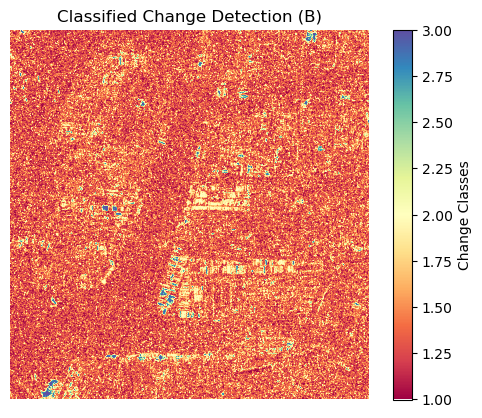

In [44]:
# 分類された画像を表示する
plt.imshow(classified_image_caseB, cmap='Spectral')
plt.colorbar(label="Change Classes")
plt.title("Classified Change Detection (B)")
plt.axis("off")
plt.show()


**分類された画像のヒストグラムを平均値と中央値でプロットする。**

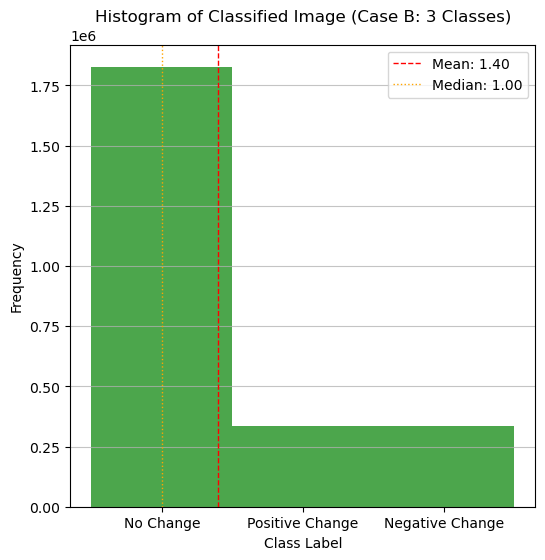

In [45]:
# ケースBの分類画像（クラスラベル）の平均値と中央値を計算する。
mean_classified_caseB = np.mean(classified_image_caseB)
median_classified_caseB = np.median(classified_image_caseB)

# ケースBの分類画像のヒストグラムをプロットする。
plt.figure(figsize=(6, 6))
plt.hist(classified_image_caseB.ravel(), bins=np.arange(1, 5) - 0.5, color='green', alpha=0.7)
plt.axvline(mean_classified_caseB, color='red', linestyle='dashed', linewidth=1, label=f'Mean: {mean_classified_caseB:.2f}')
plt.axvline(median_classified_caseB, color='orange', linestyle='dotted', linewidth=1, label=f'Median: {median_classified_caseB:.2f}')
plt.title("Histogram of Classified Image (Case B: 3 Classes)")
plt.xlabel("Class Label")
plt.ylabel("Frequency")
plt.xticks([1, 2, 3], ['No Change', 'Positive Change', 'Negative Change'])
plt.legend()
plt.grid(axis='y', alpha=0.75)  # オプション： 読みやすくするためにグリッド線を追加する
plt.show()

**差分画像と分類画像をGeoTIFFとして保存**

In [46]:
# ケースBの画像を保存するパス
difference_output_path_caseB = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/in_post_difference_image_testB.tif"
classified_output_path_caseB = "/home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/classified_change_detection_in_post_testB.tif"

# GeoTIFFとして保存するためのメタデータの更新
in_crisis_meta.update({"driver": "GTiff", "count": 1, "dtype": "float32"})

# ケースBの差分画像を保存
with rasterio.open(difference_output_path_caseB, "w", **in_crisis_meta) as dst:
    dst.write(difference_caseB, 1)  # ケースBの最初のバンドとの差額を記入する。

print(f"Difference image for Case B saved to {difference_output_path_caseB}")

# 分類された画像のメタデータを更新（クラスラベルに整数データ型を使用）
classified_meta_caseB = in_crisis_meta.copy()
classified_meta_caseB.update({"dtype": "int32"})

# ケース2の分類画像を保存
with rasterio.open(classified_output_path_caseB, "w", **classified_meta_caseB) as dst:
    dst.write(classified_image_caseB, 1)  # ケースBの分類された画像を最初のバンドに書き込む。

print(f"Classified Change Detection image for Case B saved to {classified_output_path_caseB}")



Difference image for Case B saved to /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/in_post_difference_image_testB.tif
Classified Change Detection image for Case B saved to /home/jovyan/shared/Sirinya/alos/ALOS2.1/Shimpomachi_ngo/classified_change_detection_in_post_testB.tif


### 3.3.3 グーグルアースの過去の画像でサンプリング地点の変更を検証する。

**Sentinel-2の過去の画像からサンプリング地点の変化を検証する方法**

- 台風前と台風後の画像の違いを利用する。
- 台風前(2019年10月3日)と台風後(2019年11月3日)の画像を使用し、フィルタリングされたデータを使用して、変化した領域を検証する。
- グーグルアースで過去の画像を確認する。Google Earthに確認したい日/期間の画像がない場合は、代わりにLandsatまたはSentinel-2をダウンロードして過去の画像情報を確認することができます。
- この場合、我々はSentinel-2の画像を以下からダウンロードした。 [Google Earth Engine](https://code.earthengine.google.com/3ce320461a9fa2c7402b8e5f2f793f7f).
- [QGIS](http://test.qgis.org/html/en/site/forusers/download.html) ソフトウェアをダウンロードする。.
- 台風前と台風後の画像の差分、台風前と台風後の画像のフィルタリングされたデータ、台風前と台風後の画像のSentinel-2データをQGISで開き、変化した領域を視覚的に検証する。

**危機の前と後：**

**Sample location 1**

|Difference between Pre-crisis (191127) and In-crisis (200610)|
|-------------------------------|
|![12Dif_pi1](12Dif_pi1.png)|

|ALOS-2 (filtered): Pre-crisis (191127) | Sentinel-2: Pre-crisis (Nov19)|
|-------------------------------|------------------|
| ![12Dif_pi1_1](12Dif_pi1_1.png) | ![12Dif_pi1_2](12Dif_pi1_2.png) |

|ALOS-2 (filtered): Pre-crisis (200610) | Sentinel-2: In-crisis (Jun20)|
|-------------------------------|------------------|
| ![12Dif_pi1_3](12Dif_pi1_3.png) | ![12Dif_pi1_4](12Dif_pi1_4.png) |

**Sample location 2**

|Difference between Pre-crisis (191127) and In-crisis (200610)|
|-------------------------------|
|![12Dif_pi2](12Dif_pi2.png)|

|ALOS-2 (filtered): Pre-crisis (191127) | Sentinel-2: Pre-crisis (Nov19)|
|-------------------------------|------------------|
| ![12Dif_pi2_1](12Dif_pi2_1.png) | ![12Dif_pi2_2](12Dif_pi2_2.png) |

|ALOS-2 (filtered): Pre-crisis (200610) | Sentinel-2: In-crisis (Jun20)|
|-------------------------------|------------------|
| ![12Dif_pi2_3](12Dif_pi2_3.png) | ![12Dif_pi2_4](12Dif_pi2_4.png) |

**危機の中と危機の後：**

**Sample location 1**

|Difference between In-crisis (200610) and Post-crisis (211124)|
|-------------------------------|
|![13Dif_ip1](13Dif_ip1.png)|

|ALOS-2 (filtered): In-crisis (200610) | Sentinel-2: In-crisis (Jun20)|
|-------------------------------|------------------|
| ![13Dif_ip1_1](13Dif_ip1_1.png) | ![13Dif_ip1_2](13Dif_ip1_2.png) |

|ALOS-2 (filtered): Post-crisis (211124) | Sentinel-2: Post-crisis (Nov21)|
|-------------------------------|------------------|
| ![13Dif_ip1_3](13Dif_ip1_3.png) | ![13Dif_ip1_4](13Dif_ip1_4.png) |

**Sample location 2**

|Difference between In-crisis (200610) and Post-crisis (211124)|
|-------------------------------|
|![13Dif_ip2](13Dif_ip2.png)|

|ALOS-2 (filtered): In-crisis (200610) | Sentinel-2: In-crisis (Jun20)|
|-------------------------------|------------------|
| ![13Dif_ip2_1](13Dif_ip2_1.png) | ![13Dif_ip2_2](13Dif_ip2_2.png) |

|ALOS-2 (filtered): Post-crisis (211124) | Sentinel-2: Post-crisis (Nov21)|
|-------------------------------|------------------|
| ![13Dif_ip2_3](13Dif_ip2_3.png) | ![13Dif_ip2_4](13Dif_ip2_4.png) |